In [1]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tqdm.auto import tqdm
%matplotlib inline

In [2]:
def normalize(x, invert=True):
    x = (x - x.min()) / (x.max() - x.min())
    if invert:
        x = 1 - x
    return x

def to_img(x, invert=True):
    if invert:
        x = 1 - x
    return ((x - x.min()) / (x.max() - x.min()) * 255).astype(np.uint8)

def to_array(img):
    return cv2.cvtColor(np.array(img), cv2.COLOR_RGB2GRAY)

In [3]:
img = Image.open('roughness-study/rough_1.jpg')
img_clean = Image.open('roughness-study/clean_1.jpg')
w, h = img.size
img = img.resize((w//4, h//4))
img_clean = img_clean.resize((w//4, h//4))

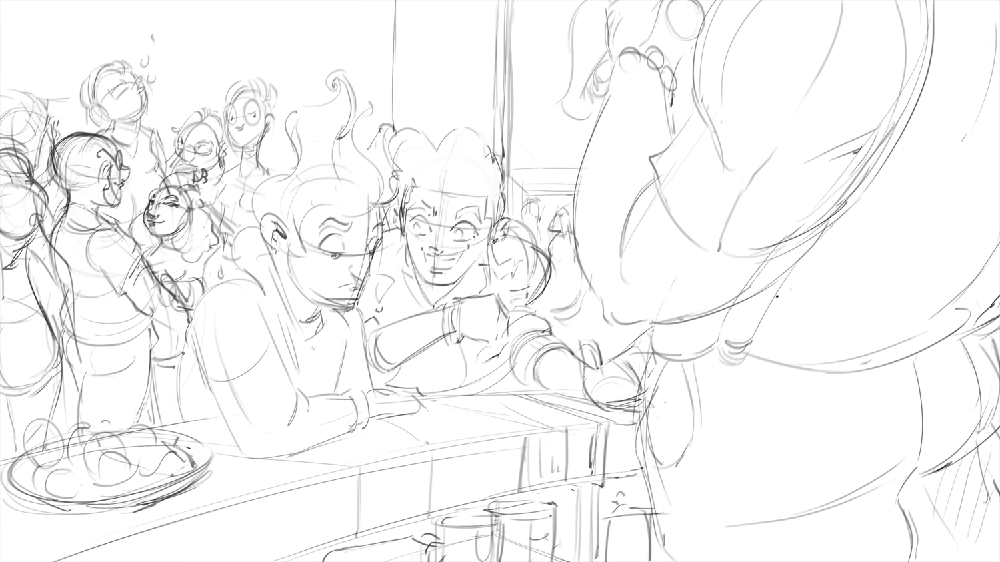

In [4]:
gray = to_array(img)
gray_clean = to_array(img_clean)
# normalize rough sketch so that the maximum line intensity is same as clean sketch
gray = to_img(gray, invert=False)
Image.fromarray(gray)

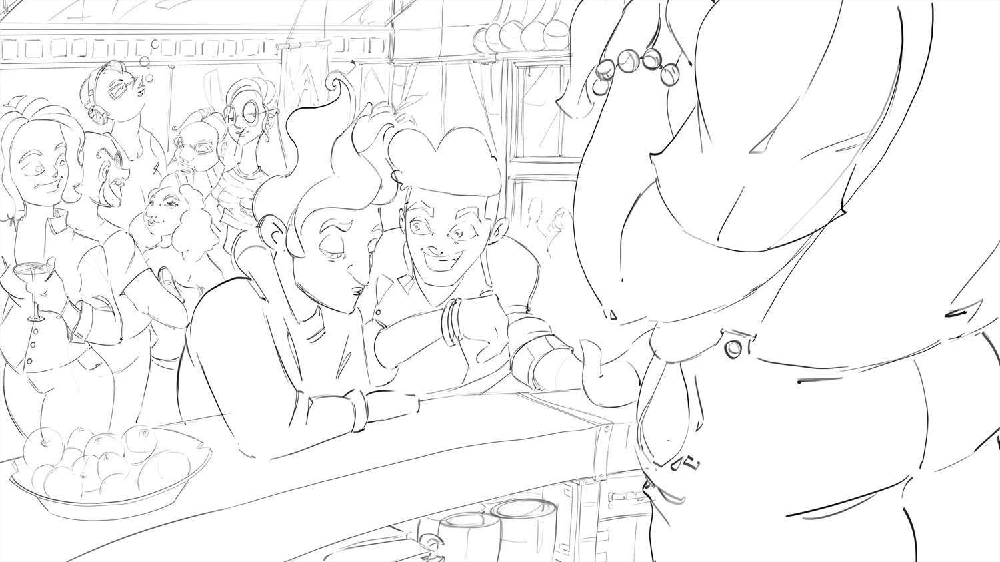

In [5]:
Image.fromarray(gray_clean)

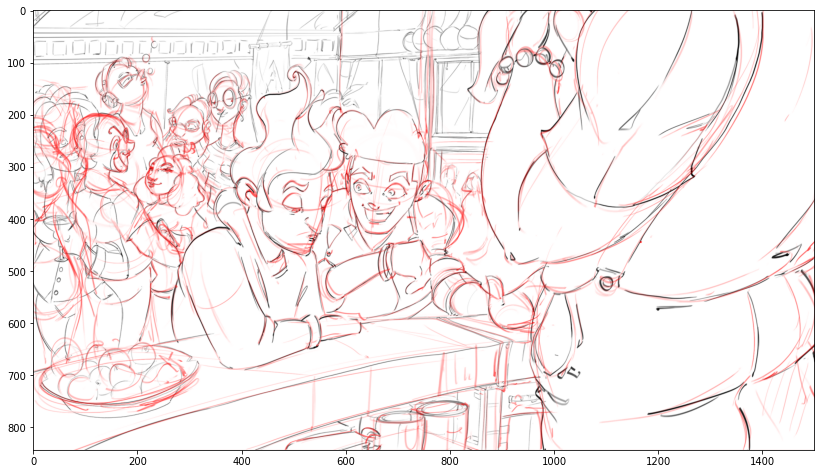

In [249]:
overlay(gray_clean, normalize(gray), dilate=False)

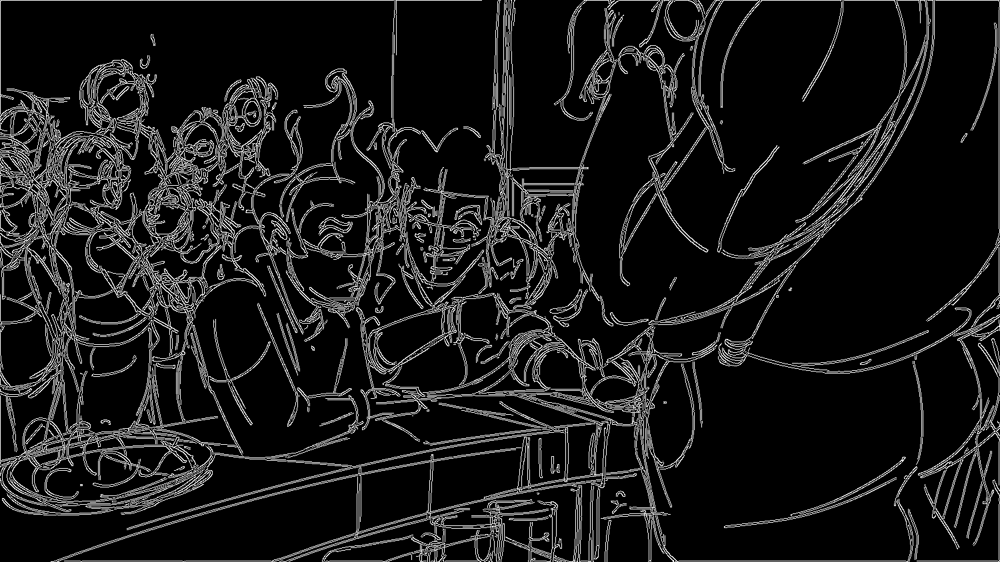

In [10]:
low_threshold = 20
high_threshold = 100
edges = cv2.Canny(gray, low_threshold, high_threshold)
edges_clean = cv2.Canny(gray_clean, low_threshold, high_threshold)
Image.fromarray(edges)

### Next Idea: detect intercepting lines
 - Need to detect crossing lines with varying angles of incidence and varying stroke width/intensity
 - In dense clusters, individual lines may meld into larger gradient fields
     - Maybe detect high-intensity pixels not adhering to strict line detectors

### Goal: Detect frequency of close, parallel lines ~(indicates roughness)~

In [5]:
def scale(x, clip_to=0.6):
    x = np.maximum(x, 0)
    return np.minimum((x / clip_to) ** 2, 1.0)

def overlay(img, overlay_arr=None, figsize=(14, 18), ax=None, color=None, overlay_color=(255, 0, 0), dilate=True): # red
    if ax is None:
        _, ax = plt.subplots(figsize=figsize)
    if color:
        img_ = []
        for i in color:
            img_ += [img]
        img = np.stack(img_, axis=2)
    else:
        img = np.stack([img, img, img], axis=2)
    if overlay_arr is not None:
        if dilate:
            overlay_arr = cv2.dilate(overlay_arr, kernel=np.ones((3, 3), np.uint8))
        overlay_img = np.zeros_like(img, np.uint8)
        overlay_img[:,:] = np.array(overlay_color)
        img = (img * (1 - overlay_arr)[:,:,None] + overlay_img * overlay_arr[:,:,None]).astype(np.uint8)
    ax.imshow(img)
    
def overlay_img(img, overlay_arr=None, figsize=(14, 18), ax=None, color=None, overlay_color=(255, 0, 0)): # red
    if ax is None:
        _, ax = plt.subplots(figsize=figsize)
    if color:
        img_ = []
        for i in color:
            img_ += [((1 - img /  255) * i).astype(np.uint8)]
        img = np.stack(img_, axis=2)
    else:
        img = np.stack([img, img, img], axis=2)
    if overlay_arr is not None:
        img_ = []
        for i in overlay_color:
            img_ += [((1 - overlay_arr /  255) * i).astype(np.uint8)]
        overlay_arr = np.stack(img_, axis=2)
        img = (img + overlay_arr) / 2
    ax.imshow(img)

In [10]:
kernel_1 = np.array([
    [3, 0, 0],
    [10, 0, 0],
    [3, 0, 0],
])
kernel_2 = np.array([
    [0, 0, 3],
    [0, 0, 10],
    [0, 0, 3],
])
kernel_neg = np.array([
    [0, -3, 0],
    [0, -10, 0],
    [0, -3, 0],
])
def find_parallel(img, penalty=1.0):
    max1 = np.maximum(cv2.filter2D(img, cv2.CV_64F, kernel=kernel_1 + kernel_neg * penalty), 0)
    max2 = np.maximum(cv2.filter2D(img, cv2.CV_64F, kernel=kernel_2 + kernel_neg * penalty), 0)
    return (
        max1 / kernel_1.sum() * max2 / kernel_2.sum(),
        max1,
        max2,
    )

def find_parallel_v2(img):
    sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=3)
    sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=3)


### Use sobel and cluster matching-directional gradients to detect parallel line groups

In [6]:
sx = np.maximum(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3), 0)
sy = np.maximum(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3), 0)
sx.max(), sy.max()

(869.0, 926.0)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


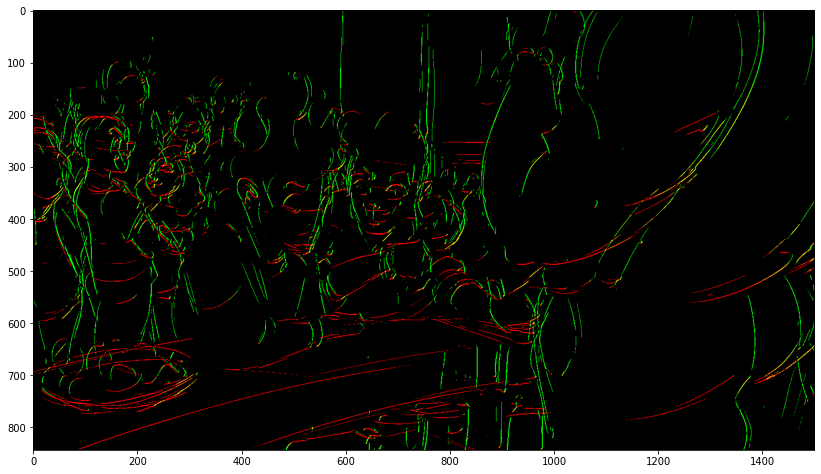

In [426]:
overlay_img(((sx < 200) * 255).astype(np.uint8), ((sy < 200) * 255).astype(np.uint8), color=(0, 255, 0))

For each output pixel in a line:
 1. count number of parallel lines *nearby* (points with similar gradident features)
 2. weight by contributions by gradient features cosine similarity
 3. tweaks
     - norm total number of lines in vicinity?
     - norm total gradient magnitude in vicinity?
     - ~~remove (close to) exactly parallel lines from calculation?~~ not the root of the issue
     - (maybe) detect lines that cross instead
     

#### 1. Count number of parallel lines in nearby points

In [7]:
def get_grad(img):
    sx = np.maximum(cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5), 0)
    sy = np.maximum(cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5), 0)
    max_val = max(sx.max(), sy.max())
    sx_n = sx / max_val
    sy_n = sy / max_val
    return sx_n, sy_n

In [8]:
# normalize gradient
max_val = max(sx.max(), sy.max())
sx_n = sx / max_val
sy_n = sy / max_val

In [20]:
eps = 1e-7

start, *_ = zip(*np.where(np.bitwise_and(gray < 255, np.maximum(sx_n, sy_n) < eps)))


(-0.05, 0.4)

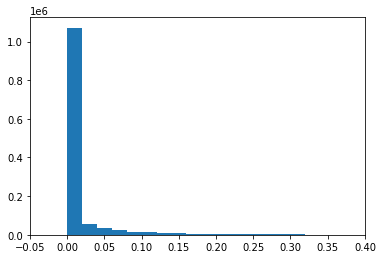

In [40]:
x = (sx_n**2 + sy_n**2)
plt.hist(x[x < 0.4].flatten(), bins=20)
plt.xlim(-0.05, 0.4)

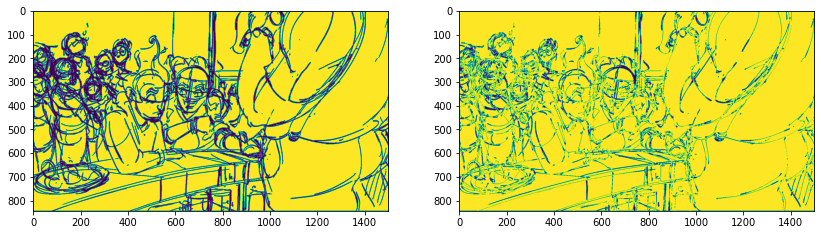

In [62]:
eps = 0.02
gray_new = gray.copy()
gray_new[gray < 255] = 0
gray_new_d = gray_new.copy()
gray_new_d[(sx_n **2 + sy_n **2) > eps] = 255

_, ax = plt.subplots(1, 2, figsize = (14, 6))
ax[0].imshow(gray_new)
ax[1].imshow(gray_new_d)

Smaller-scale lines (smaller width) less likely to contain zero-grad pixels:

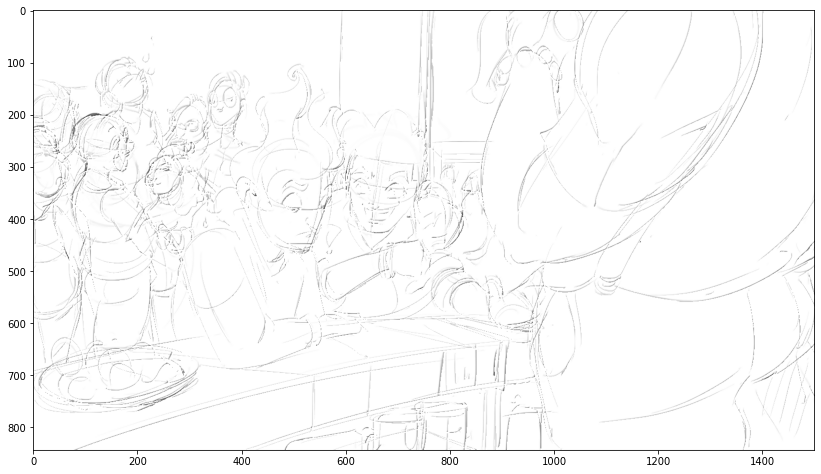

In [430]:
eps = 0.002
gray_new = gray.copy()
gray_new[(sx_n **2 + sy_n **2) > eps] = 255
overlay(gray_new)

### Reduce image to single-pixel width strokes
Multiple passes at different scales, larger scale -> lower threshold for 0-grad

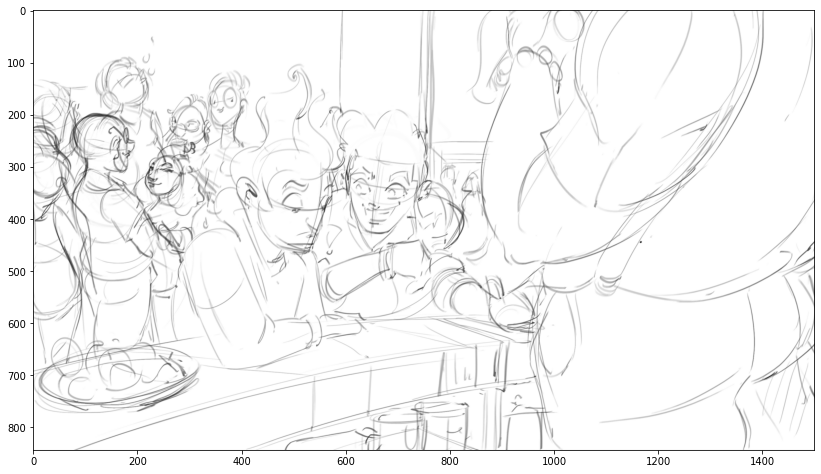

In [405]:
overlay(gray)

### Attempt at line tracking and reduction (TODO)

In [312]:
(np.zeros_like(gray) - 1).astype(np.int64)

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]])

In [362]:
small_t = 160
large_t = 250
small_eps = 0.0001
large_eps = 0.1

total_g = (sx_n**2 + sy_n**2)

gray_large_t = gray < large_t
gray_small_t = gray < small_t
g_large_t = total_g < large_eps
g_small_t = total_g < small_eps

start_pts = np.where(np.bitwise_and(gray_small_t, g_large_t))
q = list(zip(*start_pts))
out = np.zeros_like(gray).astype(np.uint8)
out.fill(255)

visited = set()
lines = []
line_lookup = np.zeros_like(gray).astype(np.int64) - 1

max_delta = 7
candidate_deltas = []
for i in range(-max_delta, max_delta + 1):
    for j in range(-max_delta, max_delta + 1):
        if not i == j == 0:
            candidate_deltas += [(i, j)]

def in_range(x, y):
    return 0 <= x < gray.shape[0] and 0 <= y < gray.shape[1]

pbar = tqdm(total=gray.size)
next_line_idx = 0
curr_line_idx = -1

while len(q) > 0:
    x, y = q.pop(0)
    curr_line_idx = line_lookup[x, y]
    pbar.update(1)
    if curr_line_idx < 0:
        curr_line_idx = next_line_idx
        lines += [curr_line_idx]
        next_line_idx += 1
    out[x, y] = 0
    for dx, dy in candidate_deltas:
        nx, ny = x + dx, y + dy
        if in_range(nx, ny) and gray_large_t[nx, ny] and g_small_t[nx, ny]:
            if (nx, ny) in visited:
                line_idx = line_lookup[nx, ny]
                line_lookup[line_lookup == line_idx] = curr_line_idx
                continue
            q += [(nx, ny)]
            visited.add((nx, ny))
            line_lookup[nx, ny] = curr_line_idx


  0%|          | 0/1266000 [00:00<?, ?it/s]

In [334]:
len(lines)

17926

In [342]:
tots = [(line_lookup == i).sum() for i in tqdm(lines)]

  0%|          | 0/17926 [00:00<?, ?it/s]

In [351]:
tots = np.array(tots)

In [352]:
np.argmax(tots)

17882

In [353]:
tots.max()

314

In [348]:
np.argmax(tots), (np.array(tots) == 17883).sum()

(17882, 0)

In [364]:
sorted(zip(tots, range(len(tots))), reverse=True)

[(314, 17882),
 (218, 17892),
 (69, 7709),
 (56, 8),
 (18, 5),
 (15, 1829),
 (13, 7867),
 (10, 1052),
 (7, 12327),
 (7, 10824),
 (5, 11053),
 (5, 5864),
 (5, 772),
 (4, 17600),
 (4, 13156),
 (4, 12760),
 (4, 11842),
 (4, 11376),
 (3, 16205),
 (3, 14539),
 (3, 14198),
 (3, 12786),
 (3, 11701),
 (3, 9305),
 (3, 8938),
 (3, 7782),
 (3, 2925),
 (3, 2467),
 (3, 1363),
 (2, 17591),
 (2, 15785),
 (2, 15383),
 (2, 15377),
 (2, 15367),
 (2, 15308),
 (2, 14322),
 (2, 14194),
 (2, 13804),
 (2, 13493),
 (2, 13266),
 (2, 13100),
 (2, 12719),
 (2, 12688),
 (2, 11839),
 (2, 11727),
 (2, 11563),
 (2, 11262),
 (2, 9906),
 (2, 9729),
 (2, 6430),
 (2, 6319),
 (2, 6295),
 (2, 5831),
 (2, 5072),
 (2, 2306),
 (2, 1813),
 (2, 1769),
 (2, 667),
 (2, 471),
 (2, 392),
 (2, 391),
 (1, 17901),
 (1, 17844),
 (1, 17733),
 (1, 17708),
 (1, 17678),
 (1, 17550),
 (1, 17523),
 (1, 17485),
 (1, 17432),
 (1, 17427),
 (1, 17341),
 (1, 17292),
 (1, 17234),
 (1, 17190),
 (1, 17177),
 (1, 17143),
 (1, 17086),
 (1, 17080),
 (

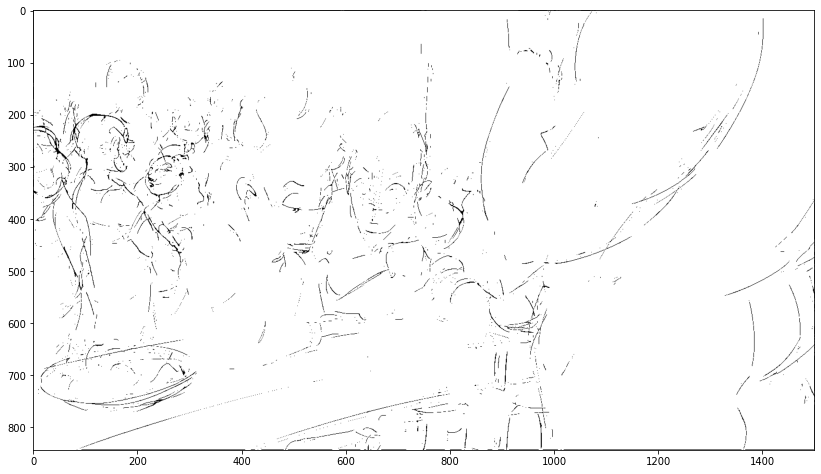

In [363]:
overlay(out, (line_lookup == 8).astype(np.uint8))

### Use average line direction in locality as indicator


In [9]:
def blur(z, steps=1):
    out = z
    for i in range(steps):
        out = cv2.GaussianBlur(out, (9, 9), 6)
    return out

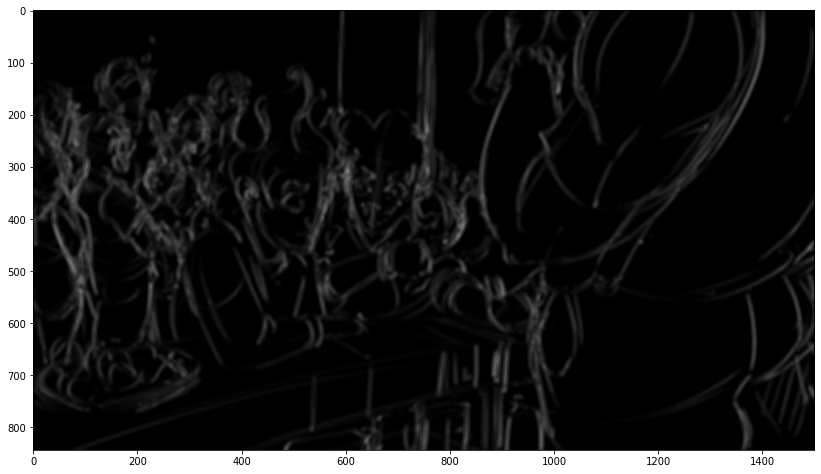

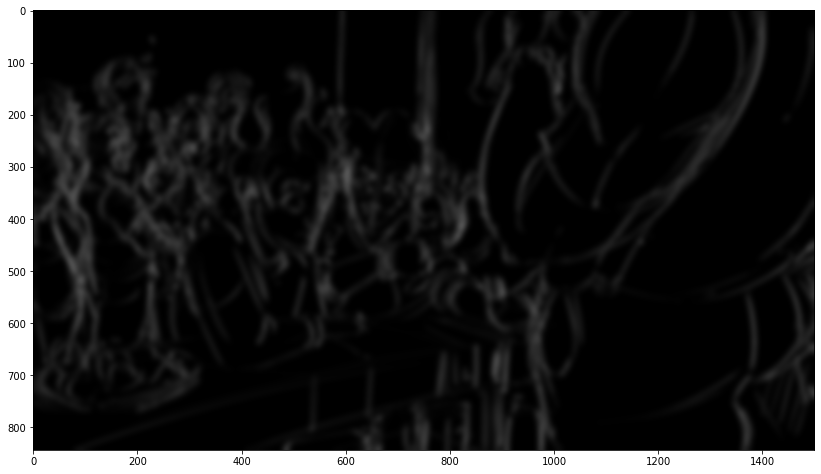

In [90]:
overlay(blur(sx_n))
overlay(blur(sx_n, steps=5))

#### Bin by line angle

In [11]:
sx = np.maximum(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3), 0)
sy = np.maximum(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3), 0)

In [12]:
s_tot = sx**2 + sy**2 
sxn = (sx**2 / (s_tot + 1e-10))**(1/2)
syn = (sy**2 / (s_tot + 1e-10))**(1/2)
sxn[sx < 0] *= -1
syn[sy < 0] *= -1

#### - Figure out why alignments are off -- get working for aggregation across x-dimension -

(array([1.194221e+06, 3.531300e+04, 1.869400e+04, 9.817000e+03,
        4.474000e+03, 2.142000e+03, 9.290000e+02, 2.880000e+02,
        1.030000e+02, 1.900000e+01]),
 array([  0. ,  86.8, 173.6, 260.4, 347.2, 434. , 520.8, 607.6, 694.4,
        781.2, 868. ]),
 <BarContainer object of 10 artists>)

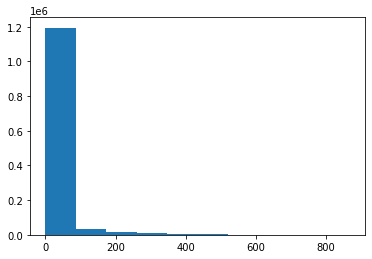

In [490]:
plt.hist(sx.flatten())

(array([1084290.,    7699.,    7414.,    6638.,    5564.,    6102.,
           5414.,   15921.,   10793.,  116165.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

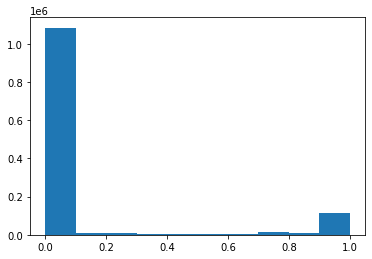

In [491]:
plt.hist(sxn.flatten())

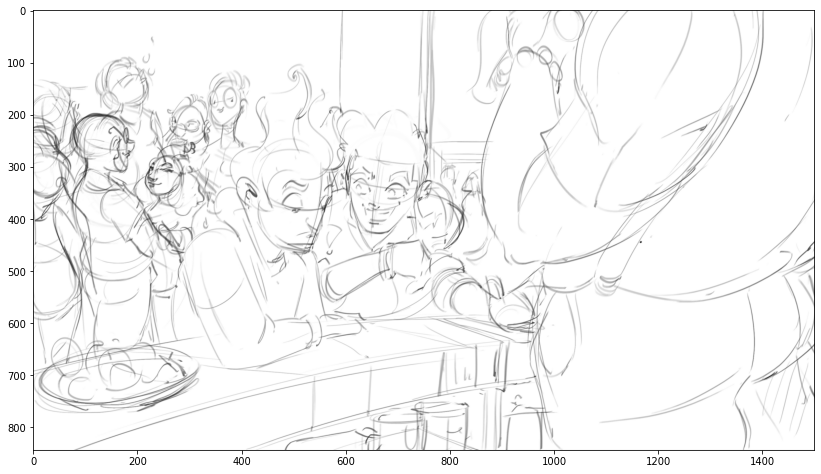

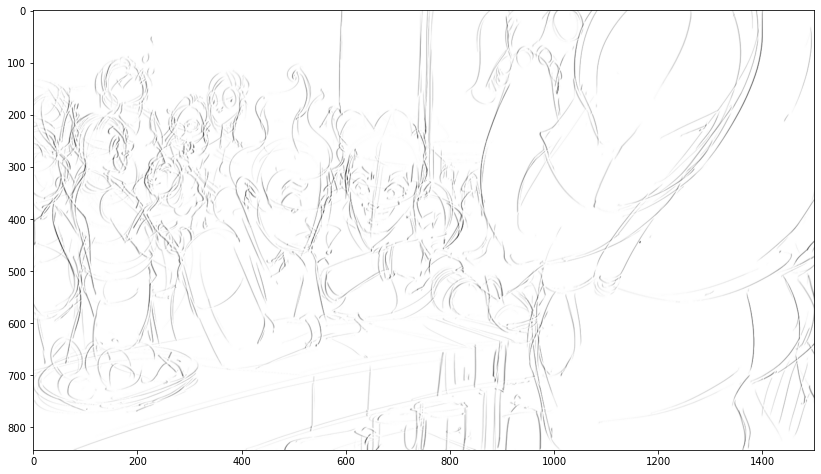

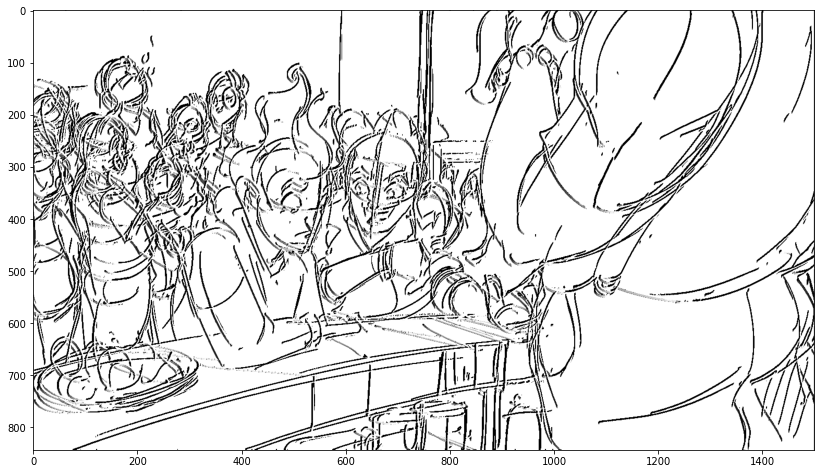

In [512]:
overlay(gray)
overlay(to_img(sx))
overlay(to_img(sxn))

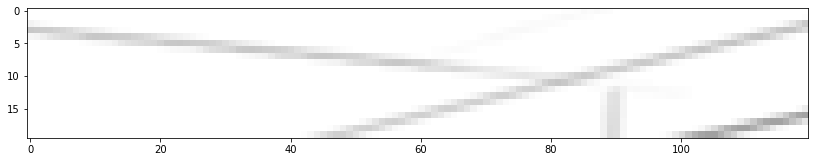

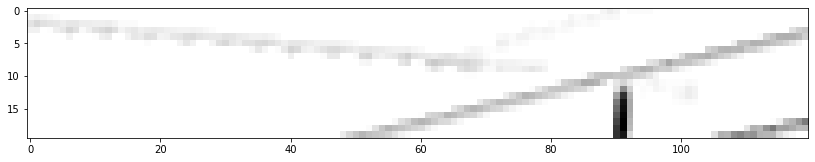

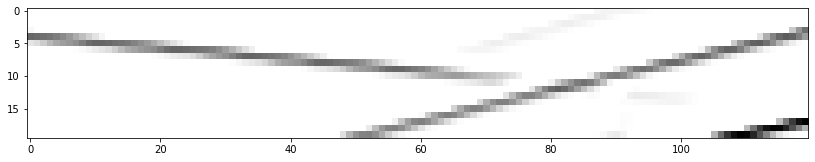

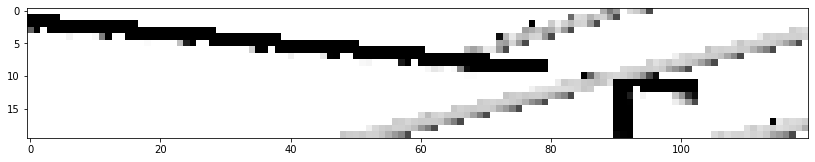

In [520]:
patch = (slice(690,710), slice(450,570))
overlay(gray[patch])
overlay(to_img(sx[patch]))
overlay(to_img(sy[patch]))
overlay(to_img(sxn[patch]))

Issue: dy is getting positioned slightly above dx so ratios arent computing properly

### Try directly detecting lines instead (IN PROGRESS)

#### First Look at thresholding by dy = dx = 0

In [10]:
n_arr = normalize(gray)

(array([1.120379e+06, 6.237600e+04, 3.794600e+04, 2.247800e+04,
        1.285100e+04, 6.208000e+03, 2.678000e+03, 9.310000e+02,
        1.430000e+02, 1.000000e+01]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

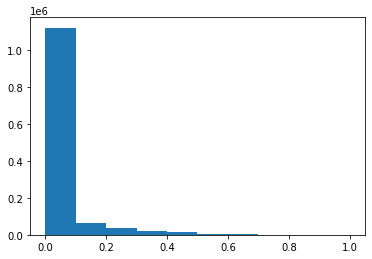

In [11]:
plt.hist(n_arr.flatten())

In [12]:
sx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3) ** 2
sy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3) ** 2
s_tot = sx + sy

In [27]:
sx.max()

755161.0

(array([1.220329e+06, 3.073600e+04, 9.825000e+03, 3.409000e+03,
        1.183000e+03, 3.470000e+02, 1.140000e+02, 4.500000e+01,
        8.000000e+00, 4.000000e+00]),
 array([     0. ,  97450.6, 194901.2, 292351.8, 389802.4, 487253. ,
        584703.6, 682154.2, 779604.8, 877055.4, 974506. ]),
 <BarContainer object of 10 artists>)

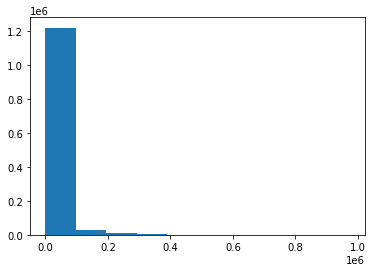

In [26]:
plt.hist(s_tot.flatten())

In [216]:
center_coef = 1.8
filter_size = 7
coeff_range = np.arange(-1, center_coef + 1e-8, (1 + center_coef) / (filter_size // 2))
f = np.array(
    [
        np.concatenate([coeff_range, coeff_range[1::-1]])
    ] * filter_size
)
f = np.array(
    [
        [-1] * (filter_size // 2) + [center_coef] + [-1] * (filter_size // 2)
    ] * filter_size
)
fx = np.array([
    [-1, center_coef, -1]
] * 3)
fy = np.array([
    [-1] * 3,
    [center_coef] * 3,
    [-1] * 3,
])
f_aggx = np.array(
    [
        [0] * filter_size
    ] * (filter_size // 2) +
    [[1] * filter_size] +
    [
        [0] * filter_size
    ] * (filter_size // 2)
)
f_aggy = np.array(
    [
        [0] * (filter_size // 2) + [1] + [0] * (filter_size // 2)
    ] * filter_size
)

In [217]:
arrx = np.minimum(np.maximum(cv2.filter2D(normalize(gray), cv2.CV_64F, fx), 0), 1)
arry = np.minimum(np.maximum(cv2.filter2D(normalize(gray), cv2.CV_64F, fy), 0), 1)
aggx = np.maximum(cv2.filter2D(arrx, cv2.CV_64F, f_aggx) - 1, 0)  # TODO: improve aggregation method (work on thresholding above)
aggy = np.maximum(cv2.filter2D(arry, cv2.CV_64F, f_aggy) - 1, 0)

In [193]:
img_arr.shape

(844, 1500)

In [195]:
cv2.resize(img_arr, img_arr.shape).shape

(1500, 844)

In [186]:
1 /0.5

2.0

In [192]:
i = 1
cv2.resize(img_arr, (844 // int(1 / i), 1500 // int(1 / i))).shape

(1500, 844)

In [182]:
img_arr = normalize(gray)
i = 0.5
cv2.resize(img_arr, (img_arr.shape[0] // (1 / i), img_arr.shape[1] // (1 / i)))

error: OpenCV(4.6.0) :-1: error: (-5:Bad argument) in function 'resize'
> Overload resolution failed:
>  - Can't parse 'dsize'. Sequence item with index 0 has a wrong type
>  - Can't parse 'dsize'. Sequence item with index 0 has a wrong type


In [229]:
def get_parallel(img_arr, scales=[1, 2, 4, 8]):
    arr = np.minimum(np.maximum(cv2.filter2D(img_arr, cv2.CV_64F, fx), 0), 1)
    scaled_aggs = []
    for i in scales:
        resized = cv2.resize(arr, (arr.shape[1] // i, arr.shape[0] // i))
        agg = np.maximum(cv2.filter2D(resized, cv2.CV_64F, f_aggx) - 1, 0)
        scaled_aggs += [cv2.resize(agg, (arr.shape[1], arr.shape[0]))]
    return scaled_aggs

In [235]:
aggs = get_parallel(normalize(gray))
aggs_clean = get_parallel(normalize(gray_clean))

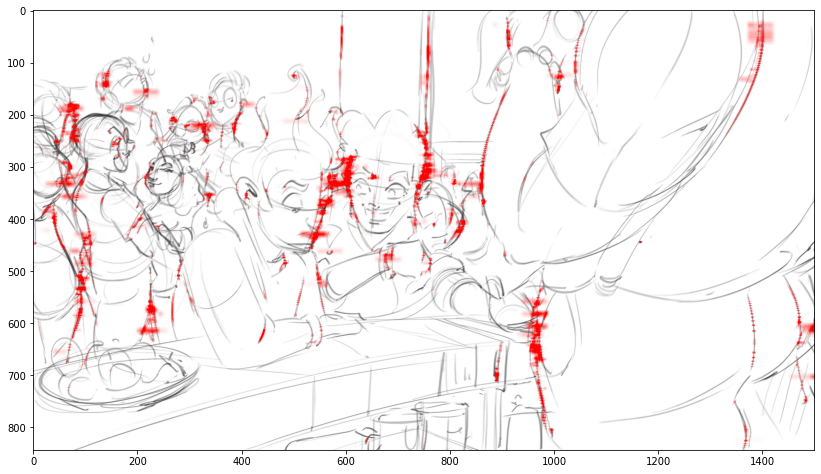

In [236]:
agg_tot = np.minimum(1, sum(aggs))
overlay(gray, normalize(agg_tot, invert=False), dilate=False)

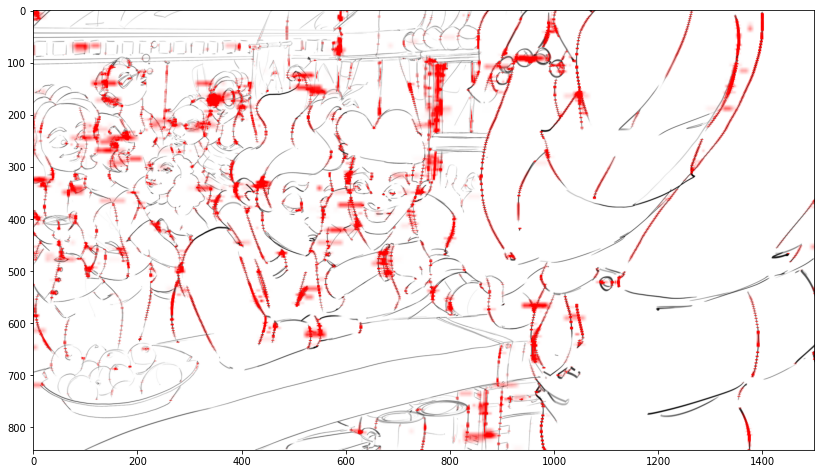

In [234]:
agg_tot_c = np.minimum(1, sum(aggs_clean))
overlay(gray_clean, normalize(agg_tot_c, invert=False), dilate=False)

In [238]:
agg_tot.sum(), agg_tot_c.sum()

(24224.349150560825, 51255.5753015429)

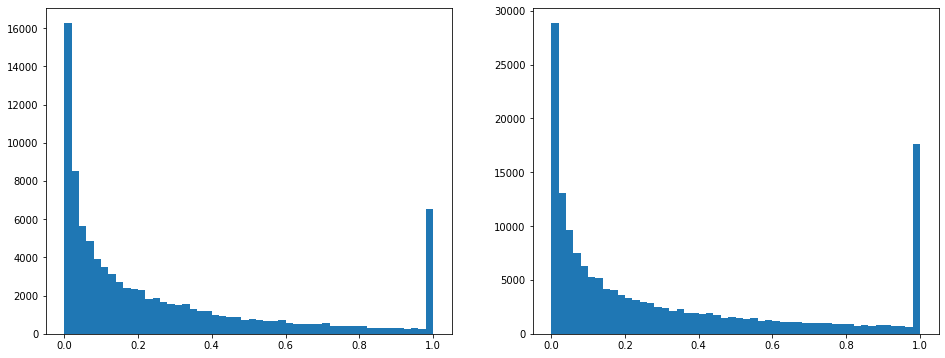

In [246]:
_, ax = plt.subplots(1, 2, figsize=(16, 6))
ax[0].hist(agg_tot[agg_tot > 0].flatten(), bins=50)
_ = ax[1].hist(agg_tot_c[agg_tot_c > 0].flatten(), bins=50)

## Conclusion: Using parallel lines just doesnt work

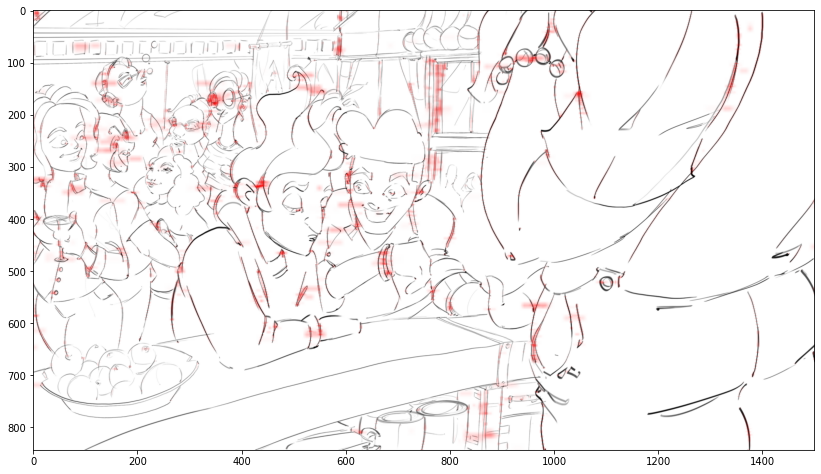

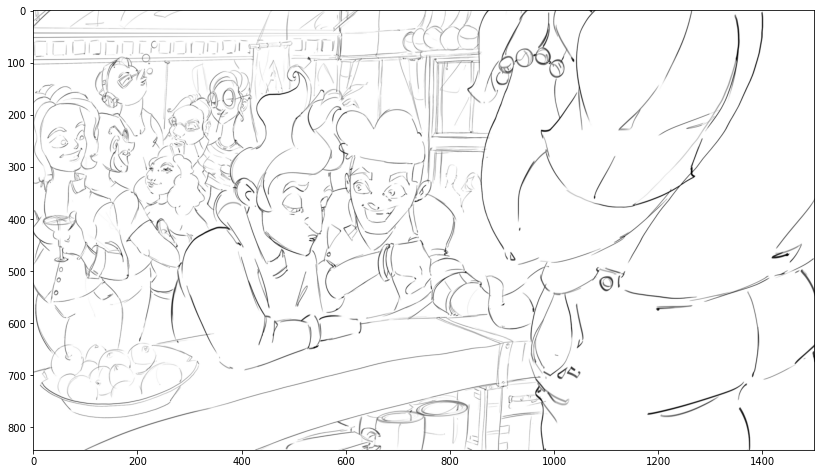

In [215]:
agg_tot = sum(aggs_clean)
overlay(gray_clean, normalize(agg_tot, invert=False), dilate=False)
overlay(gray_clean)

Text(0.5, 1.0, 'visualize ratio of pixels in vertical line activations that have low enough horizontal grad')

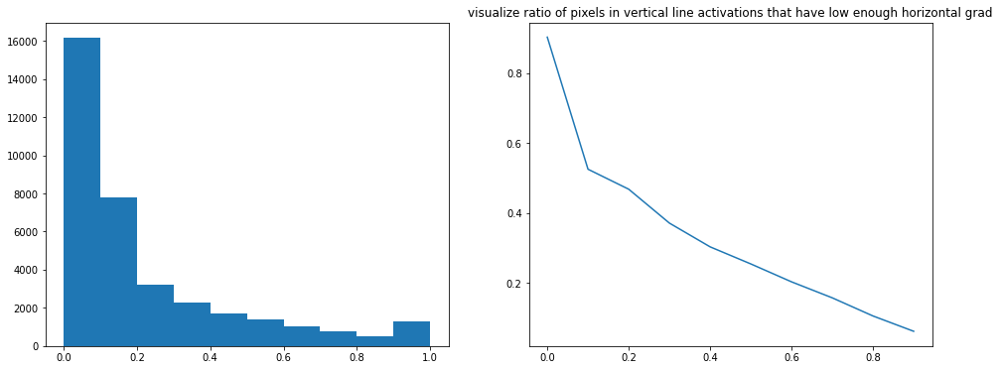

In [156]:
# filter out non-max line pixels
sobely = cv2.Sobel(normalize(gray),cv2.CV_64F,0,1,ksize=3) ** 2
_, ax = plt.subplots(1, 2, figsize=(16, 6))
def compute_ratio(t):
    t_sobely = sobely > t
    t_arry = arry > t
    t_all = np.bitwise_and(t_sobely, t_arry)
    return t_all.sum() / t_arry.sum()
range_ = np.arange(0, 1.0, 0.1)
ax[0].hist(arry[arry > 0].flatten())
ax[1].plot(range_, [compute_ratio(t) for t in range_])
# t_all.sum() / t_arry.sum()
plt.title('visualize ratio of pixels in vertical line activations that have low enough horizontal grad')

Text(0.5, 1.0, 'visualize ratio of pixels in vertical line activations that have low enough horizontal grad')

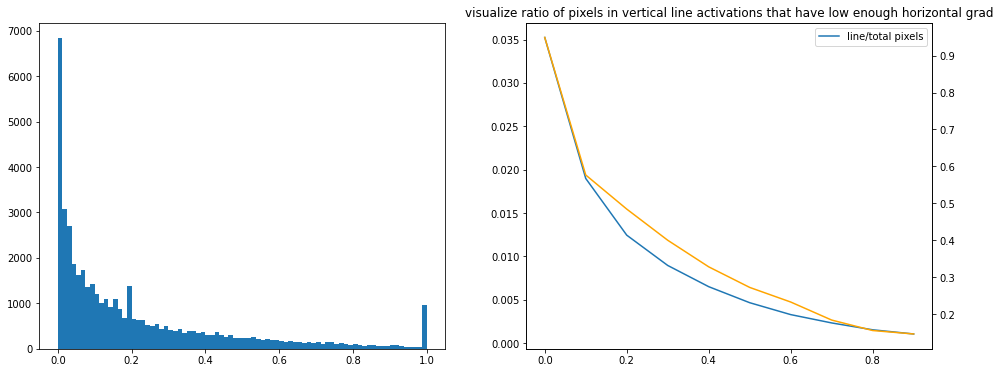

In [173]:
# filter out non-max line pixels
sobelx = cv2.Sobel(normalize(gray),cv2.CV_64F,1, 0,ksize=3) ** 2
_, ax = plt.subplots(1, 2, figsize=(16, 6))
def compute_ratio(t):
    t_sobelx = sobelx > t
    t_arrx = arrx > t
    t_all = np.bitwise_and(t_sobelx, t_arrx)
    return t_all.sum() / t_arrx.sum(), t_arrx.sum() / t_arrx.size
range_ = np.arange(0, 1.0, 0.1)
ax[0].hist(arrx[arrx>0].flatten(), bins=80)
ax[1].plot(range_, [compute_ratio(t)[1] for t in range_], label='line/total pixels')
ax_ = ax[1].twinx()
ax_.plot(range_, [compute_ratio(t)[0] for t in range_], label='low grad/line', c='orange')
ax[1].legend()
# t_all.sum() / t_arry.sum()
plt.title('visualize ratio of pixels in vertical line activations that have low enough horizontal grad')

To minimize AUC let's go with grad threshold of 0.15 for y dimension and 3 filter-width

In [117]:
arry = np.minimum(np.maximum(cv2.filter2D(normalize(gray), cv2.CV_64F, fy), 0), 1)
arry[sobely > 0.15] = 0
aggy = np.maximum(cv2.filter2D(arry, cv2.CV_64F, f_aggy) - 1, 0)

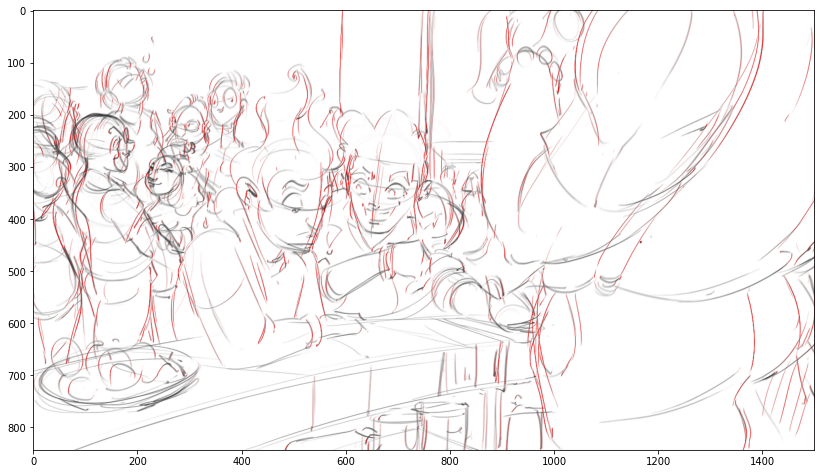

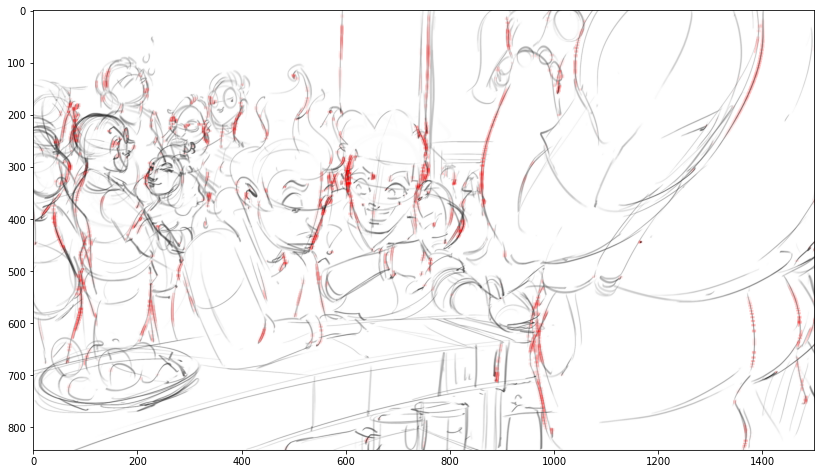

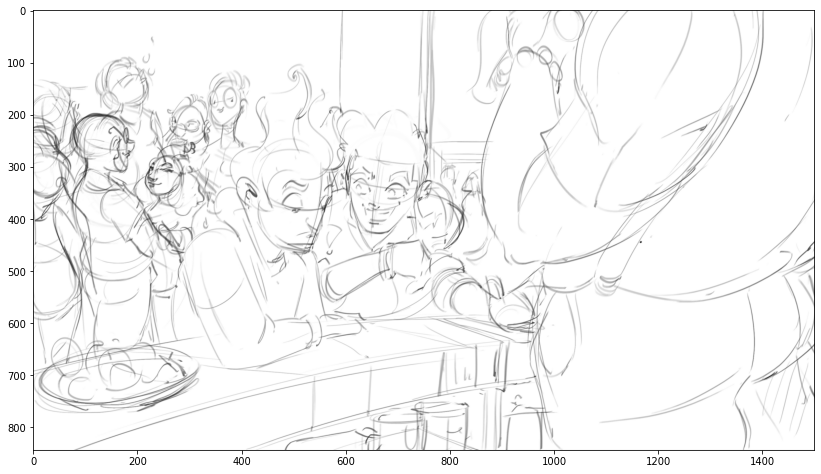

In [179]:
overlay(gray, normalize(arrx, invert=False), dilate=False)
overlay(gray, normalize(aggx, invert=False))
overlay(gray)

#### Why is the butt crack activating stongly

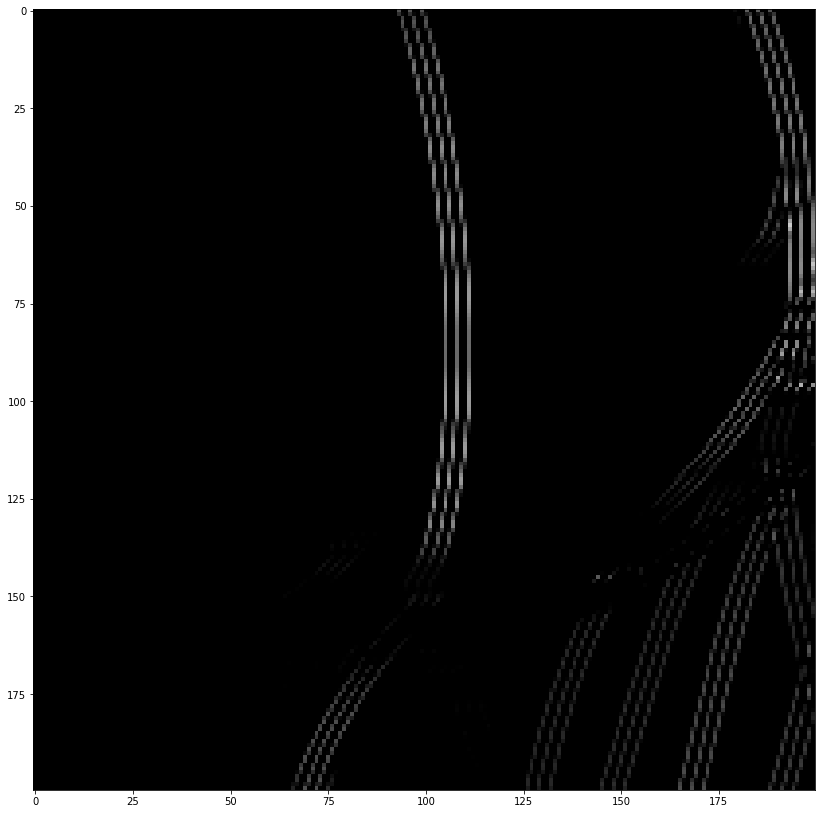

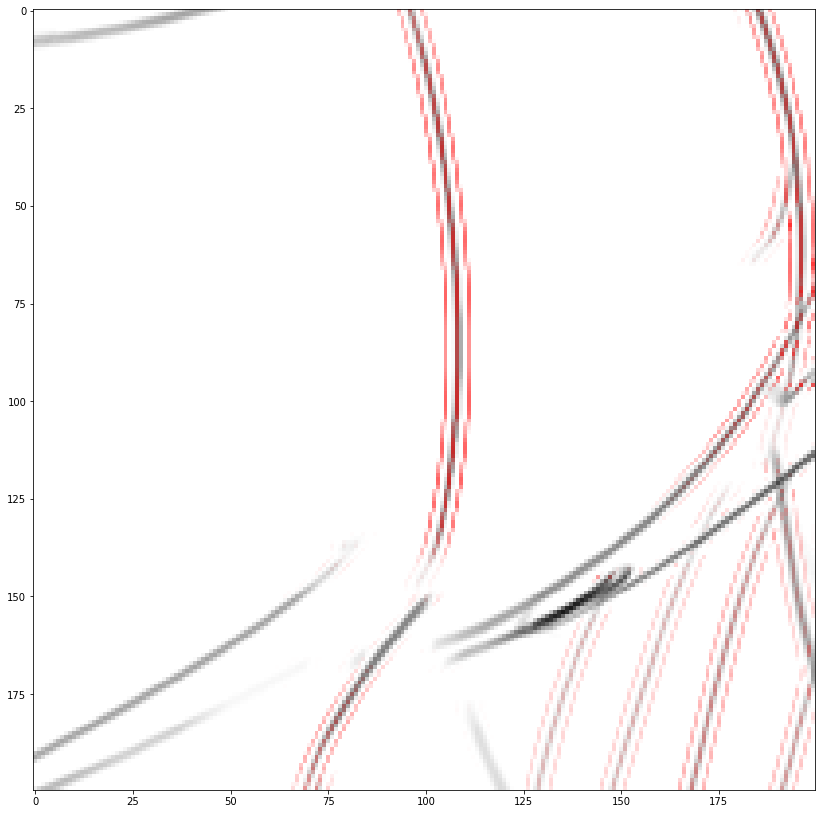

In [151]:
centerx = 650
centery = 1375
s = 100
overlay(arrx[centerx-s:centerx+s,centery-s:centery+s])
overlay(gray[centerx-s:centerx+s,centery-s:centery+s], normalize(arrx, invert=False)[centerx-s:centerx+s,centery-s:centery+s], dilate=False)

#### - end -

In [433]:
filter_size = 5
filters = [
    np.array([[0] * filter_size] * (filter_size // 2) + [[1] * filter_size] + [[0] * filter_size] * (filter_size // 2)),
    np.array([[1 if i == j else 0 for j in range(filter_size)] for i in range(filter_size)]),
    np.array([[0] * (filter_size // 2) + [1] + [0] * (filter_size // 2)] * filter_size),
    np.array([[1 if i == filter_size - j - 1 else 0 for j in range(filter_size)] for i in range(filter_size)]),
]

alignments = []
for i, f in enumerate(filters):
    angles = np.arccos(sxn)
    angles[syn < 0] *= -1
    alignment = np.abs(np.cos(angles + i * np.pi / 4))
    alignment[s_tot == 0] = 0
    alignments += [alignment]

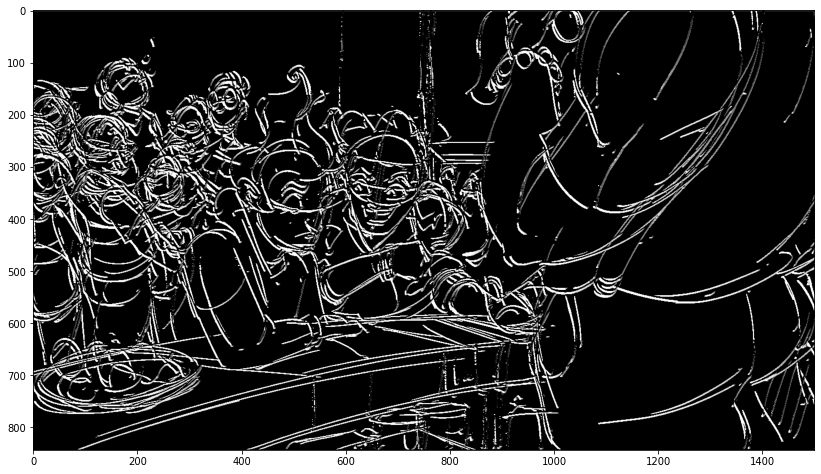

In [434]:
overlay(alignments[2])

#### Aggregate line angle bins spatially

In [435]:
agg = []
for alignment, f in zip(alignments, filters):
    agg += [np.maximum(cv2.filter2D(alignment, cv2.CV_64F, kernel=f), 0)]

In [436]:
[(a.min(), a.max()) for a in agg]

[(0.0, 4.9999999999999964), (0.0, 3.5355339059327373), (0.0, 5.0), (0.0, 5.0)]

In [445]:
all_bins = np.minimum(1, (agg[0] > t) + (agg[1] > t) + (agg[2] > t) + (agg[3] > t))
total_agg = agg[0] + agg[1] + agg[2] + agg[3]

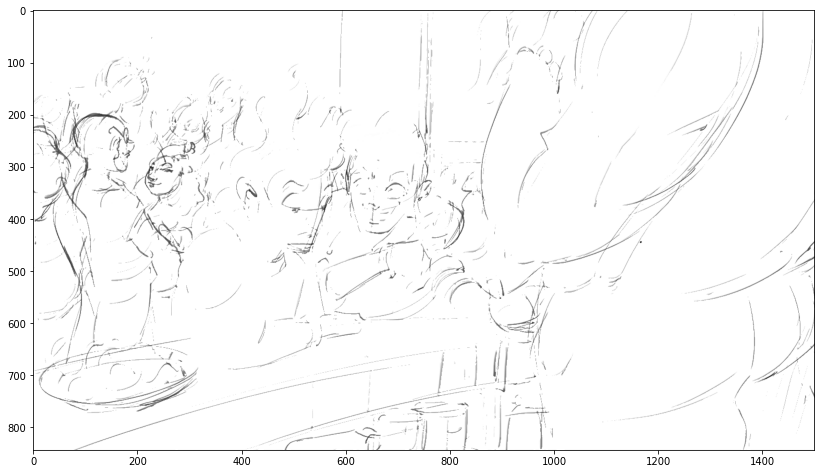

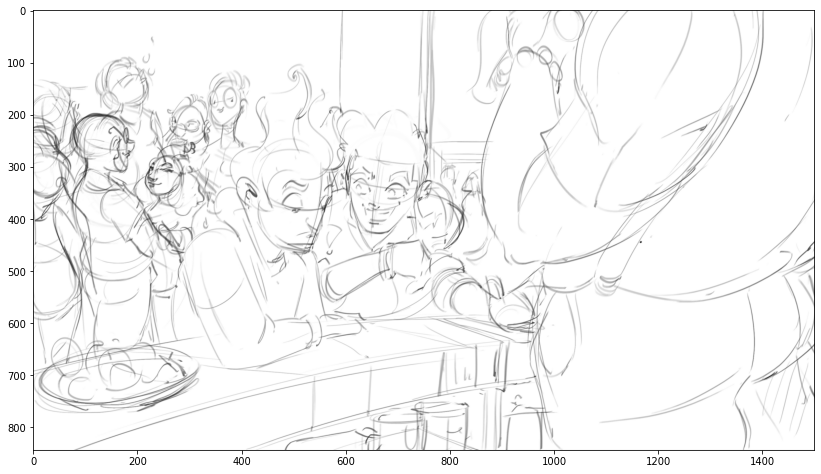

In [450]:
gray_arr = 1 - gray / 255

ratio_t = 30
gray_erode_high_g = gray.copy()
gray_erode_high_g[total_agg / (gray_arr + 1e-10) > ratio_t] = 255
overlay(gray_erode_high_g)
overlay(gray)

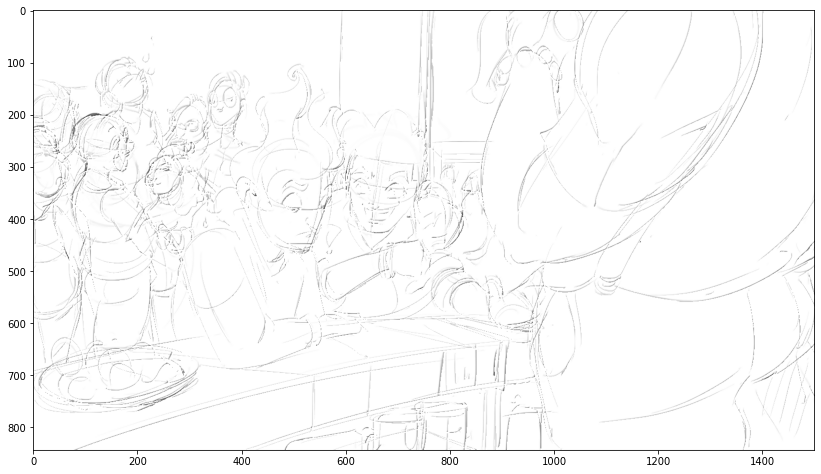

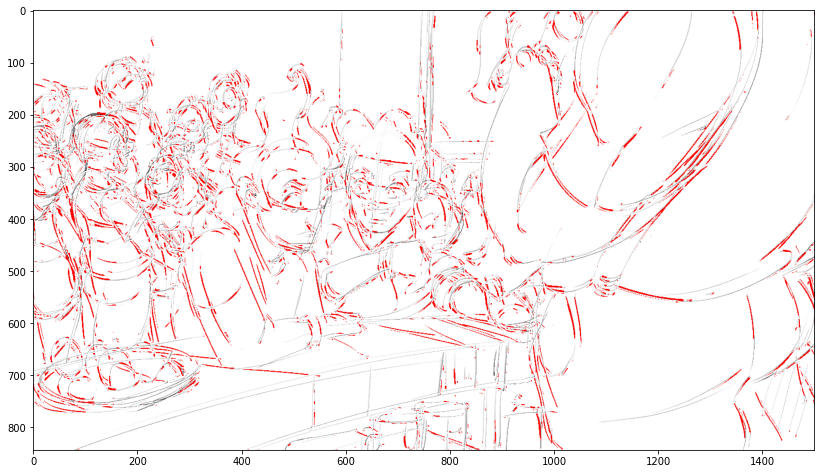

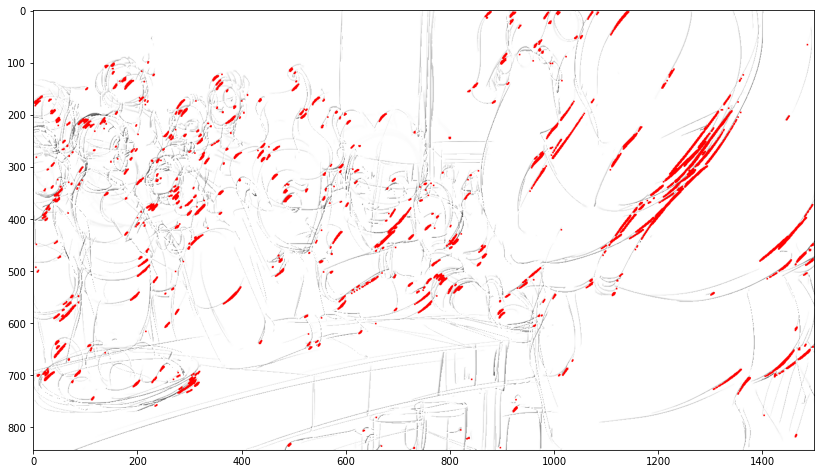

In [437]:
t = 4.9
overlay(gray_new)
overlay(gray_new, all_bins.astype(np.uint8), dilate=False)
overlay(gray_new, (agg[3] > t).astype(np.uint8))

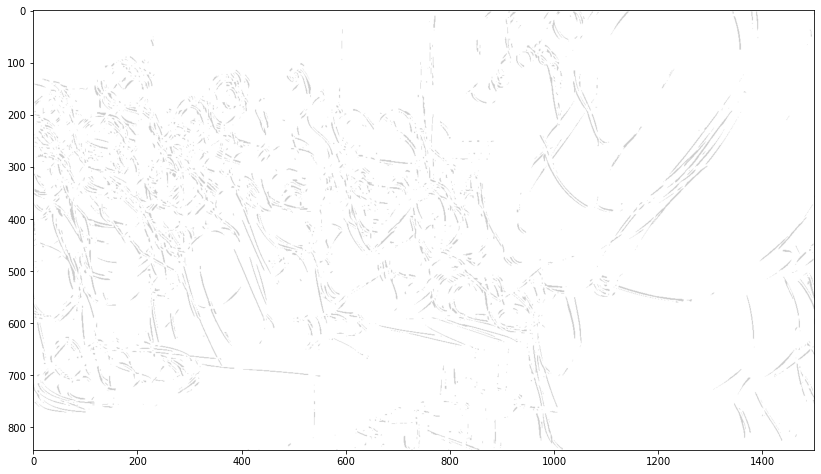

In [451]:
overlay(((1 - all_bins / 5) * 255).astype(np.uint8))

#### Why are single lines showing up as high parallel aggregations?

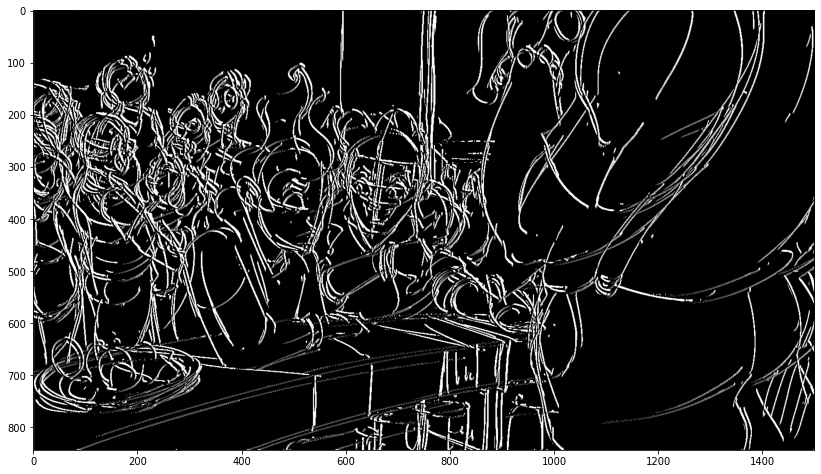

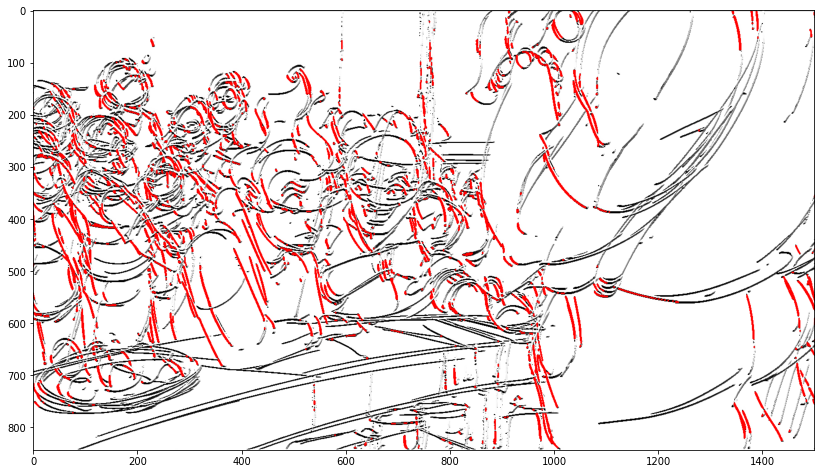

In [469]:
overlay(alignments[0])
overlay(((1 - alignments[2]) * 255).astype(np.uint8), (agg[2] > t).astype(np.uint8))

#### Try on clean image

In [289]:
sx = np.maximum(cv2.Sobel(gray_clean, cv2.CV_64F, 1, 0, ksize=5), 0)
sy = np.maximum(cv2.Sobel(gray_clean, cv2.CV_64F, 0, 1, ksize=5), 0)

In [290]:
s_tot = sx**2 + sy**2 
sxn = (sx**2 / (s_tot + 1e-10))**(1/2)
syn = (sy**2 / (s_tot + 1e-10))**(1/2)
sxn[sx < 0] *= -1
syn[sy < 0] *= -1

In [295]:
filter_size = 5
filters = [
    np.array([[0] * filter_size] * (filter_size // 2) + [[1] * filter_size] + [[0] * filter_size] * (filter_size // 2)),
    np.array([[1 if i == j else 0 for j in range(filter_size)] for i in range(filter_size)]),
    np.array([[0] * (filter_size // 2) + [1] + [0] * (filter_size // 2)] * filter_size),
    np.array([[1 if i == filter_size - j - 1 else 0 for j in range(filter_size)] for i in range(filter_size)]),
]

alignments = []
for i, f in enumerate(filters):
    angles = np.arccos(sxn)
    angles[syn < 0] *= -1
    alignment = np.abs(np.cos(angles + i * np.pi / 4))
    alignment[s_tot == 0] = 0
    alignments += [alignment]

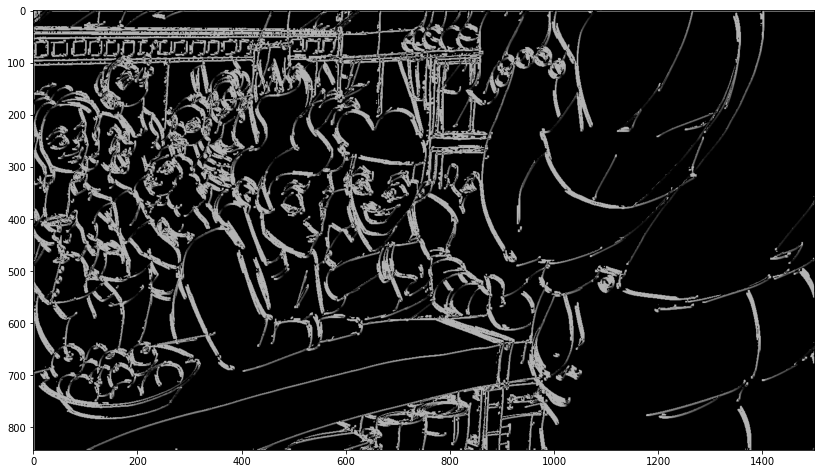

In [296]:
overlay(alignments[1])

#### Aggregate line angle bins spatially

In [297]:
agg = []
for alignment, f in zip(alignments, filters):
    agg += [np.maximum(cv2.filter2D(alignment, cv2.CV_64F, kernel=f), 0)]

In [298]:
[(a.min(), a.max()) for a in agg]

[(0.0, 5.0), (0.0, 3.5355339059327378), (0.0, 5.0), (0.0, 5.0)]

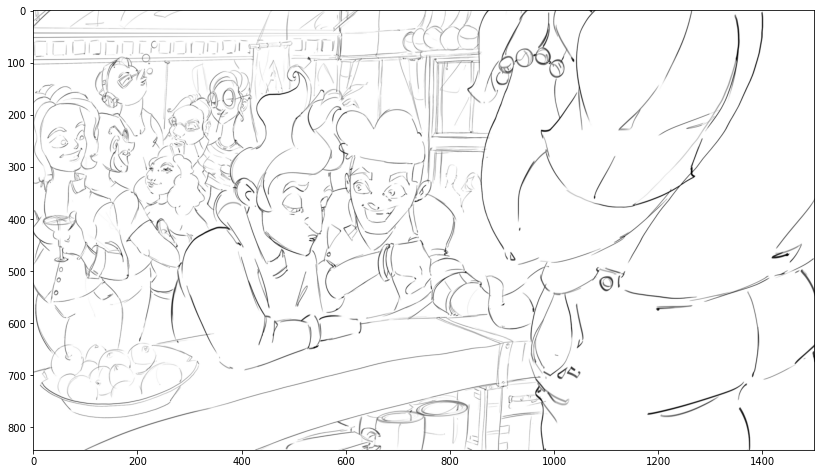

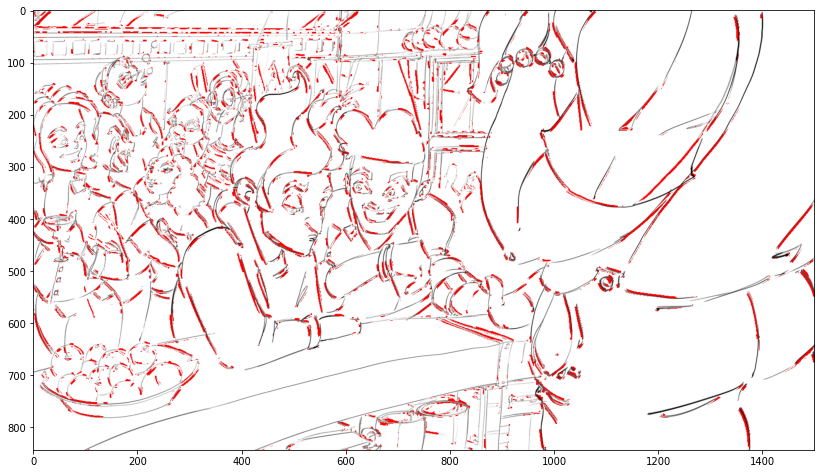

In [300]:
t = 4.9
overlay(gray_clean)
all_bins = np.minimum(1, (agg[0] > t) + (agg[1] > t) + (agg[2] > t) + (agg[3] > t))
overlay(gray_clean, all_bins.astype(np.uint8), dilate=False)

In [125]:
sx_2 = sx_n **2
sy_2 = sy_n **2

def make_p_mask(steps):

    sx_g = blur(sx_n, steps=steps)
    sy_g = blur(sy_n, steps=steps)

    parallel_mask = (sx_n) * (sx_g) + (sy_n ) * (sy_g)
    return parallel_mask

def make_p_mask_from_img(img, steps):
    sx_n, sy_n = get_grad(img)
    
    sx_g = blur(sx_n, steps=steps)
    sy_g = blur(sy_n, steps=steps)
    
    total_g = sx_g**2 + sy_g**2

    parallel_mask = ((sx_n) * (sx_g) + (sy_n ) * (sy_g)) / (total_g + 1e-10)
    return parallel_mask

In [117]:
a = make_p_mask_from_img(gray_clean, 10)
b = make_p_mask_from_img(gray, 10)

In [122]:
a.max(), b.max()

(16.368584117725867, 25.685215441982013)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


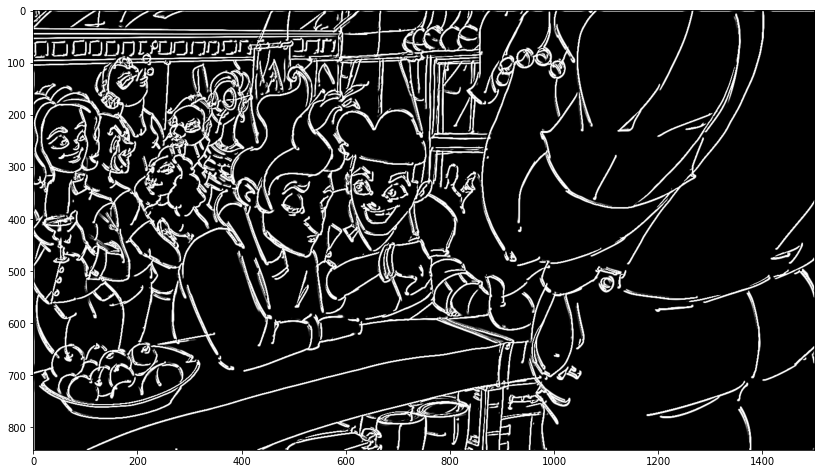

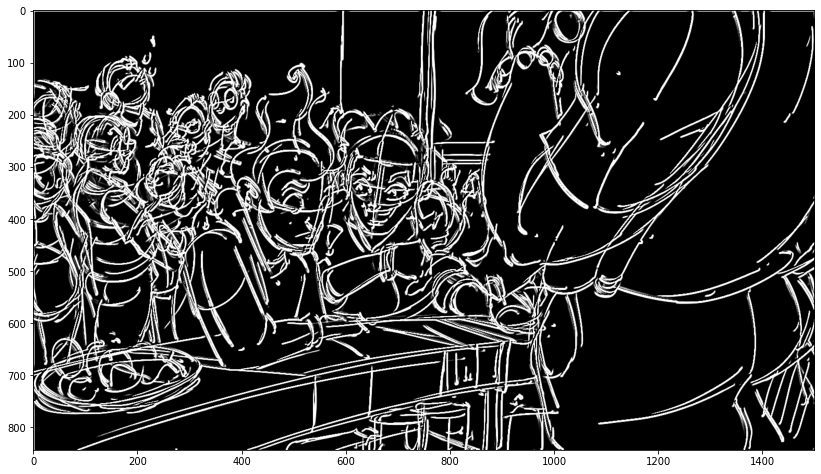

In [126]:
overlay(make_p_mask_from_img(gray_clean, 10))
overlay(make_p_mask_from_img(gray, 10))

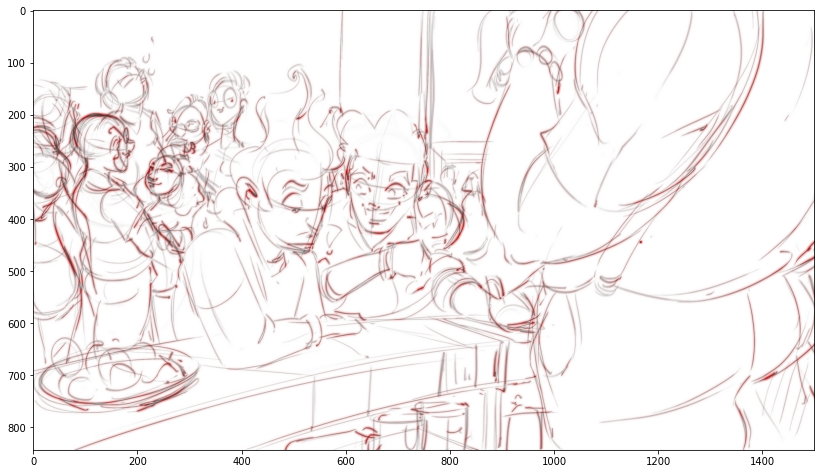

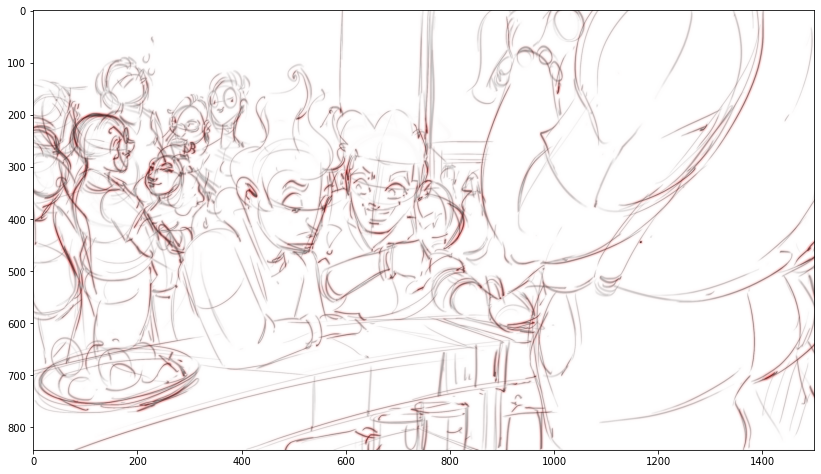

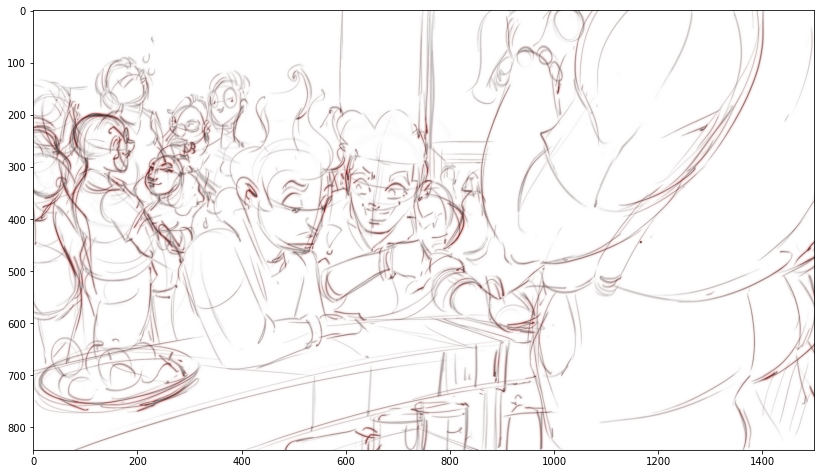

In [104]:
overlay(gray, make_p_mask(1))
overlay(gray, make_p_mask(4))
overlay(gray, make_p_mask(12))

### Using specialized filters

In [426]:
kernel_size = 3, 3
norm_gray = normalize(gray)
blur_gray = cv2.dilate(norm_gray, kernel=np.ones(kernel_size, np.uint8))
parallel_x, max1, max2 = find_parallel(blur_gray, penalty=1.0)

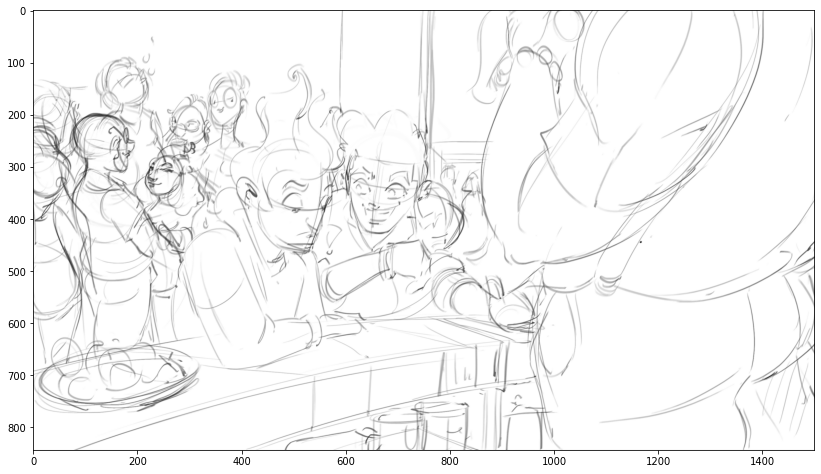

In [427]:
overlay(gray)

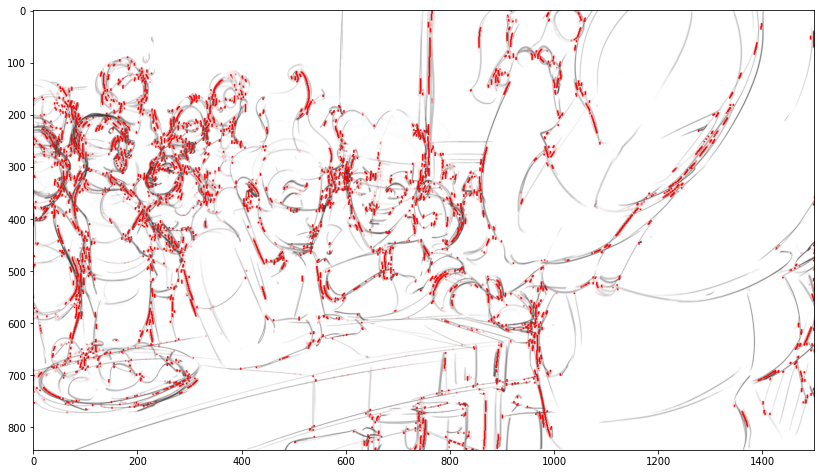

In [435]:
overlay(gray, scale(parallel_x, clip_to=0.001))

In [402]:
kernel_size = 3, 3
norm_gray_clean = normalize(gray_clean)
blur_gray_clean = cv2.dilate(norm_gray_clean, kernel=np.ones(kernel_size, np.uint8))
parallel_x_clean, max1, max2 = find_parallel(blur_gray_clean, penalty=1.0)

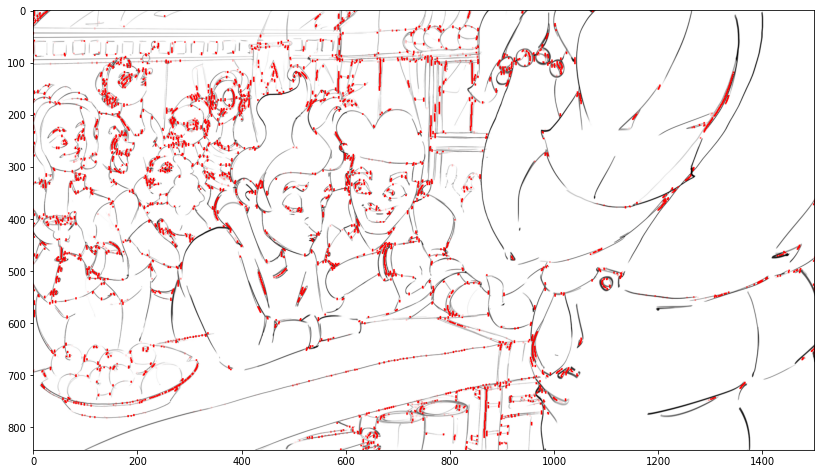

In [436]:
overlay(gray_clean, scale(parallel_x_clean, clip_to=0.001))

(0.0, 1000.0)

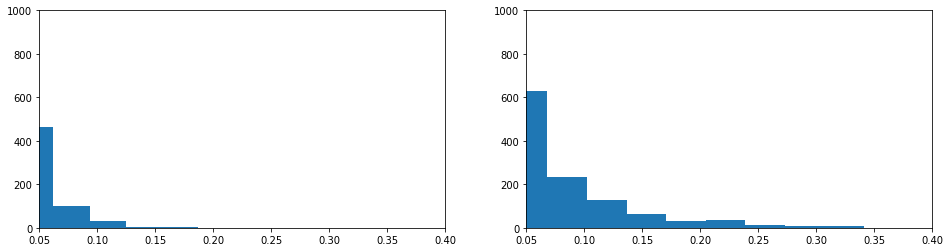

In [429]:
xlim = (0.05, 0.4)
ylim = (0, 1000)
_, ax = plt.subplots(1, 2, figsize=(16, 4))
ax[0].hist(parallel_x.flatten())
ax[1].hist(parallel_x_clean.flatten())
ax[0].set_xlim(*xlim)
ax[0].set_ylim(*ylim)
ax[1].set_xlim(*xlim)
ax[1].set_ylim(*ylim)

In [434]:
(parallel_x > 0).sum(), (parallel_x_clean > 0).sum()

(23245, 15408)

In [437]:
parallel_x.sum(), parallel_x_clean.sum()

(89.290001261534, 138.90236922097267)

While there are higher value detections in the distribution tail for the clean sketch, there are more detections overall in the rough sketch, with a visibly wider spread

### Detecting parallels across multiple scales

In [438]:
def parallel_from_img(img, kernel_size=(3, 3)):
    norm_gray_clean = normalize(img)
    return find_parallel(norm_gray_clean, penalty=1.0)

In [485]:
arr[0,0]

255

In [488]:
arr

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 244, 250, ..., 255, 255, 255],
       [255, 246, 247, ..., 255, 255, 255],
       [255, 249, 244, ..., 255, 255, 255]], dtype=uint8)

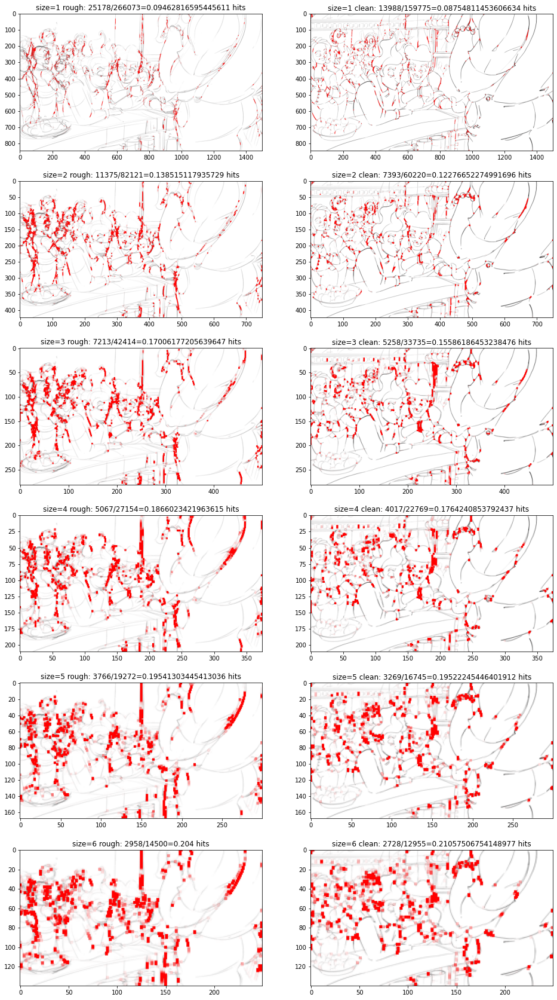

In [501]:
sizes = [1, 2, 3, 4, 5, 6]
w, h = img.size

fig, ax = plt.subplots(len(sizes), 2, figsize=(16, 5*len(sizes)))

for i, size in enumerate(sizes):
    resized = img.resize((w // size, h // size))
    resized_clean = img_clean.resize((w // size, h // size))
    arr = to_array(resized)
    arr_clean = to_array(resized_clean)
    parallel_x, _, _ = parallel_from_img(arr)
    parallel_x_clean, _, _, = parallel_from_img(arr_clean)
    overlay(arr, scale(parallel_x, clip_to=0.01), ax=ax[i, 0])
    overlay(arr_clean, scale(parallel_x_clean, clip_to=0.01), ax=ax[i, 1])
    ax[i, 0].set_title(f"size={size} rough: {(parallel_x > 0).sum()}/{(arr < 255).sum()}={(parallel_x > 0).sum()/(arr < 255).sum()} hits")
    ax[i, 1].set_title(f"size={size} clean: {(parallel_x_clean > 0).sum()}/{(arr_clean < 255).sum()}={(parallel_x_clean > 0).sum()/(arr_clean < 255).sum()} hits")

In [504]:
img = Image.open('roughness-study/loose_2.jpg')
img_clean = Image.open('roughness-study/rough_2.jpg')
w, h = img.size
img = img.resize((w//2, h//2))
img_clean = img_clean.resize((w//2, h//2))

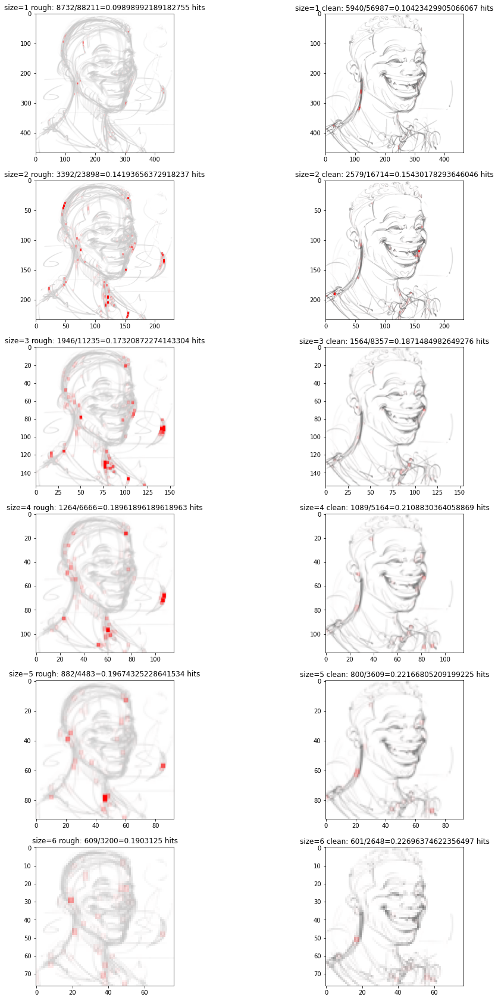

In [507]:
sizes = [1, 2, 3, 4, 5, 6]
w, h = img.size
clip_to = 0.2

fig, ax = plt.subplots(len(sizes), 2, figsize=(16, 5*len(sizes)))

for i, size in enumerate(sizes):
    resized = img.resize((w // size, h // size))
    resized_clean = img_clean.resize((w // size, h // size))
    arr = to_array(resized)
    arr_clean = to_array(resized_clean)
    parallel_x, _, _ = parallel_from_img(arr)
    parallel_x_clean, _, _, = parallel_from_img(arr_clean)
    overlay(arr, scale(parallel_x, clip_to=clip_to), ax=ax[i, 0])
    overlay(arr_clean, scale(parallel_x_clean, clip_to=clip_to), ax=ax[i, 1])
    ax[i, 0].set_title(f"size={size} rough: {(parallel_x > 0).sum()}/{(arr < 255).sum()}={(parallel_x > 0).sum()/(arr < 255).sum()} hits")
    ax[i, 1].set_title(f"size={size} clean: {(parallel_x_clean > 0).sum()}/{(arr_clean < 255).sum()}={(parallel_x_clean > 0).sum()/(arr_clean < 255).sum()} hits")

Gap in detection count between clean and rough sketches decreases with scale. Spread of detections seems to be a solid indicator

### Idea: instead of filtering on gaps, filter on edges and find way to aggregate parallel edges spatially